In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys, os
from utils import *
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
from atow_estimation.paths import INTERIM_DATA_DIR

In [3]:
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)
pd.set_option('display.max_columns', None)

In [4]:
# data = pd.read_csv('initial_preprocessed_dataset.csv')
data = pd.read_csv("data_with_full_climbing_vel.csv")
data = process_data_model_1(data)

Rows with nan features dropped: 92


In [5]:
data.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 16444 entries, 0 to 16535
Data columns (total 74 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   ADEPLat                         16444 non-null  float64
 1   ADEPLong                        16444 non-null  float64
 2   ADESLat                         16444 non-null  float64
 3   ADESLong                        16444 non-null  float64
 4   routeType                       16444 non-null  object 
 5   aircraftType                    16444 non-null  object 
 6   airlineCode                     16444 non-null  object 
 7   tow                             16444 non-null  float64
 8   flightType                      16444 non-null  object 
 9   wake                            16444 non-null  object 
 10  RECATwake                       16444 non-null  object 
 11  numberOfEngines                 16444 non-null  float64
 12  cruiseSpeed                     16444

# EDA

In [6]:
categorical_variables = ['routeType', 'flightType', 'wake', 'RECATwake', 'numberOfEngines', 'aircraftType', 'airlineCode']

numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns.difference(categorical_variables)

# general statistics

In [22]:
# non_null_count = data.count()
# dtypes = data.dtypes

# # Generate descriptive statistics for numeric columns and select only count, mean, std, min, and max
# desc_stats = data.describe(percentiles=[0.25, 0.5, 0.75]).T[['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max']]

# # Combine non-null count, dtype, and the descriptive statistics into one DataFrame
# summary_df = pd.DataFrame({
#     'Non-null Count': non_null_count,
#     'Dtype': dtypes
# }).join(desc_stats)
# summary_df

# duplicates

In [23]:
data.duplicated().sum()

0

# categorical variables

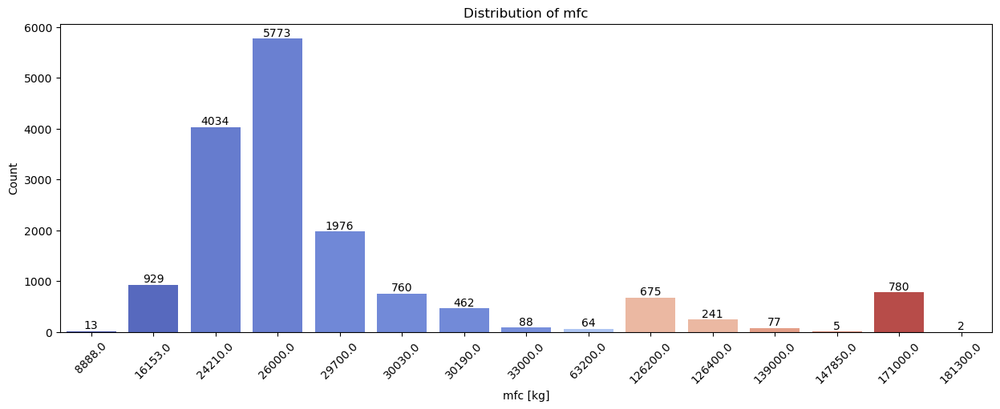

In [24]:
# col = 'wake'
# plt.figure(figsize=(15, 5))
# order = sorted(data[col].dropna().unique())
# sns.countplot(data=data, x=col, hue=col, legend=False, order=order, palette="coolwarm")        
# plt.title(f"Distribution of {col}")
# plt.xlabel(col)
# plt.ylabel("Count")        
# if data[col].nunique() > 50:
#     plt.xticks([])
# else:
#     plt.xticks(rotation=45)
# plt.show()

col = 'mfc'
plt.figure(figsize=(15, 5))
order = sorted(data[col].dropna().unique())
ax = sns.countplot(data=data, x=col, hue=col, legend=False, order=order, palette="coolwarm")        
plt.title(f"Distribution of {col}")
plt.xlabel(f'{col} [kg]')
plt.ylabel("Count")

# Loop over each patch (bar) and add a text annotation for the count
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height + 0.5, int(height), 
            ha='center', va='bottom')

if data[col].nunique() > 50:
    plt.xticks([])
else:
    plt.xticks(rotation=45)
plt.show()


/tmp/ipykernel_8400/4173330029.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y='tow', data=data, palette="Set3")


<Figure size 1200x600 with 0 Axes>

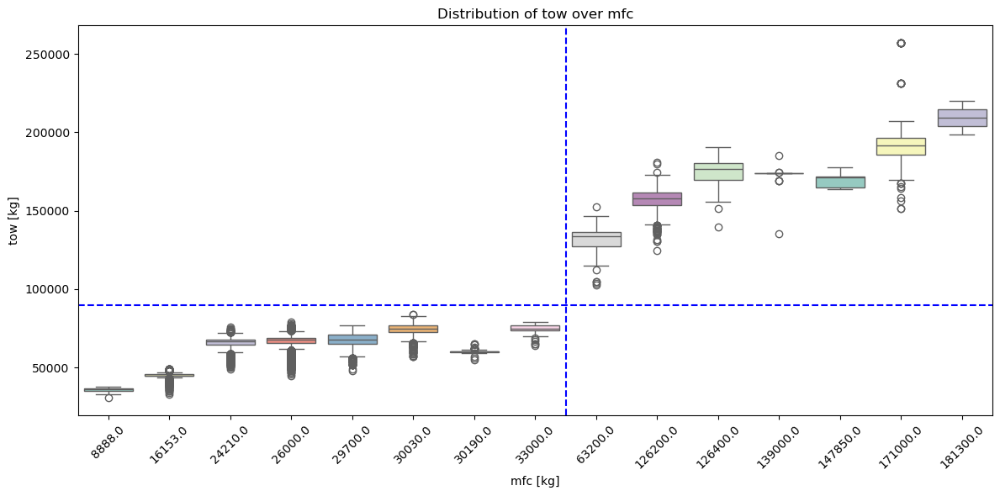

In [25]:
# cat_col = 'mtow'
# plt.figure(figsize=(12, 6))
# order = sorted(data[data[cat_col] < 158700][cat_col].dropna().unique())
# sns.boxplot(x=data[data[cat_col] < 158700][cat_col], hue=data[data[cat_col] <= 158700][cat_col], y=data['tow'], order=order, palette="Set3", legend=False)
# plt.xticks(rotation=45)
# plt.title(f"Distribution of tow over {cat_col}")
# if data[cat_col].nunique() > 50:
#     plt.xticks([])
# else:
#     plt.xticks(rotation=45)
# plt.show()

cat_col = 'mfc'
plt.figure(figsize=(12, 6))

# Filter the data first
# filtered_data = data[data[cat_col] >= 63200]

# Create the boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=cat_col, y='tow', data=data, palette="Set3")

# # Add a horizontal line at a specified y-value
horizontal_line_value = 90000  # Change this to your desired y-value
plt.axhline(y=horizontal_line_value, color='b', linestyle='--', label=f'Horizontal line at {horizontal_line_value}')

# Add a vertical line at a specified x-value
vertical_line_value = 7.5  # Change this to your desired x-position (index)
plt.axvline(x=vertical_line_value, color='b', linestyle='--', label=f'Vertical line at index {vertical_line_value}')

plt.title(f"Distribution of tow over {cat_col}")
if data[cat_col].nunique() > 50:
    plt.xticks([])
else:
    plt.xticks(rotation=45)
plt.xlabel(f'{cat_col} [kg]')
plt.ylabel('tow [kg]')
plt.tight_layout()
plt.show()

/tmp/ipykernel_8400/831600476.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y='tow', data=filtered_data, palette="Set3")


<Figure size 1200x600 with 0 Axes>

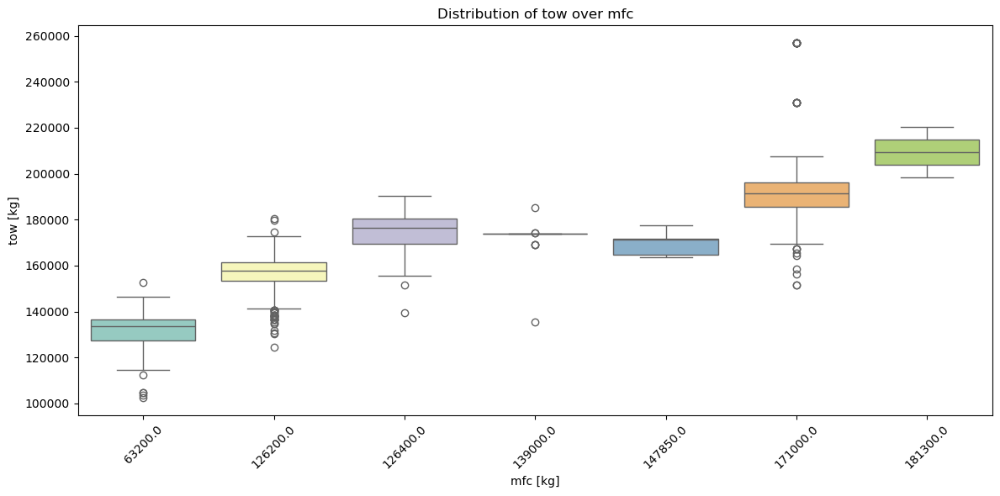

In [26]:
cat_col = 'mfc'
plt.figure(figsize=(12, 6))

# Filter the data first
filtered_data = data[data[cat_col] > 33000]

# Create the boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=cat_col, y='tow', data=filtered_data, palette="Set3")

plt.title(f"Distribution of tow over {cat_col}")
if filtered_data[cat_col].nunique() > 50:
    plt.xticks([])
else:
    plt.xticks(rotation=45)
plt.xlabel(f'{cat_col} [kg]')
plt.ylabel('tow [kg]')
plt.tight_layout()
plt.show()

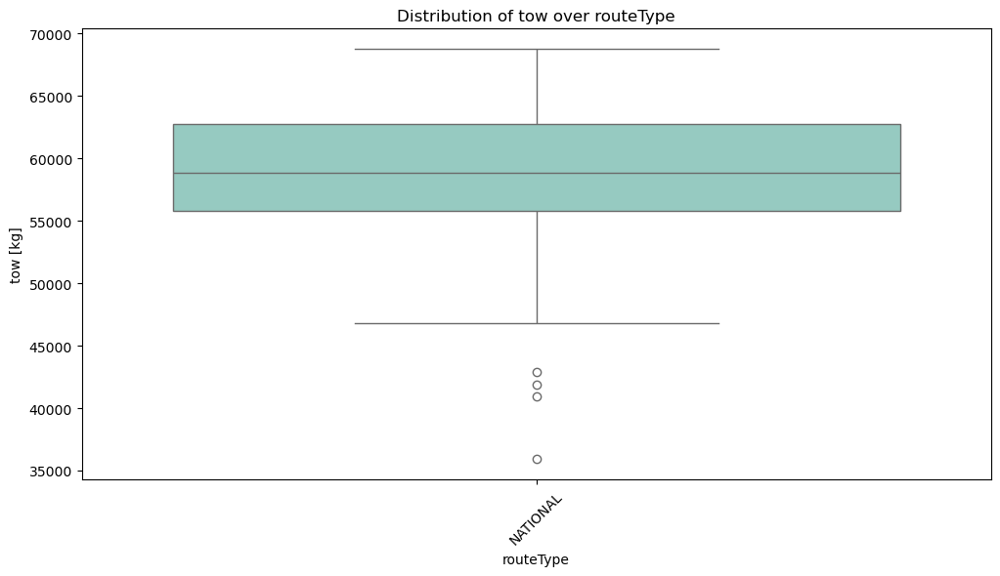

In [27]:
cat_col = 'routeType'
plt.figure(figsize=(12, 6))
order = sorted(data[data[cat_col] == 'NATIONAL'][cat_col].dropna().unique())
sns.boxplot(x=data[data[cat_col] == 'NATIONAL'][cat_col], hue=data[data[cat_col] == 'NATIONAL'][cat_col], y=data['tow'], order=order, palette="Set3", legend=False)
plt.xticks(rotation=45)
plt.title(f"Distribution of tow over {cat_col}")
plt.ylabel("tow [kg]")
if data[cat_col].nunique() > 50:
    plt.xticks([])
else:
    plt.xticks(rotation=45)
plt.show()

In [28]:
def plot_categorical_counts(df, categorical_columns, category_threshold=50):
    for col in categorical_columns:
        plt.figure(figsize=(15, 5))
        order = sorted(df[col].dropna().unique())
        sns.countplot(data=df, x=col, hue=col, legend=False, order=order, palette="coolwarm")        
        plt.title(f"Distribution of {col}")
        plt.xlabel(col)
        plt.ylabel("Count")        
        if df[col].nunique() > category_threshold:
            plt.xticks([])
        else:
            plt.xticks(rotation=45)
        plt.show()
        
def plot_boxplots(df, categorical_columns, category_threshold=50):
    for cat_col in categorical_columns:
        plt.figure(figsize=(15, 5))
        order = sorted(df[cat_col].dropna().unique())
        sns.boxplot(x=df[cat_col], hue=df[cat_col], y=df['tow'], order=order, palette="Set3", legend=False)
        plt.xticks(rotation=45)
        plt.title(f"Distribution of tow over {cat_col}")
        if df[cat_col].nunique() > category_threshold:
            plt.xticks([])
        else:
            plt.xticks(rotation=45)
        plt.show()        

/tmp/ipykernel_8400/1921152861.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='aircraftType', y='tow', data=filtered_data,


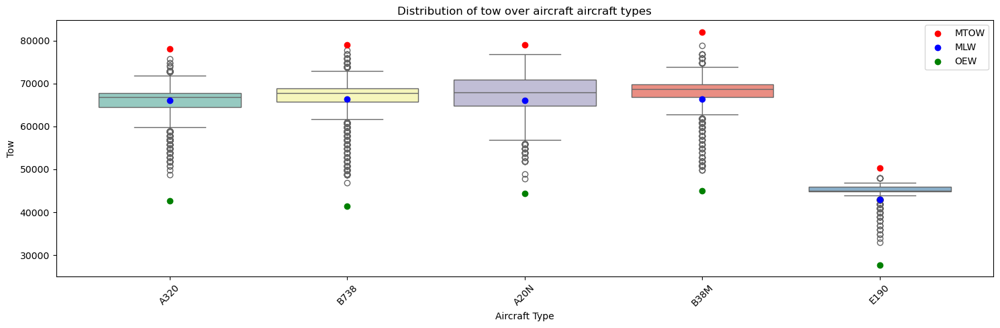

In [29]:
top_aircrafts = data['aircraftType'].value_counts().nlargest(5).index
filtered_data = data[data['aircraftType'].isin(top_aircrafts)]

# Determine order of aircraft types as in boxplot
aircraft_order = filtered_data['aircraftType'].value_counts().loc[top_aircrafts].index.tolist()

# Get unique mtow value per aircraftType from filtered_data
mtow_values = filtered_data[['aircraftType', 'mtow']].drop_duplicates('aircraftType')
mtow_values = mtow_values.set_index('aircraftType').loc[aircraft_order]

mlw_values = filtered_data[['aircraftType', 'mlw']].drop_duplicates('aircraftType')
mlw_values = mlw_values.set_index('aircraftType').loc[aircraft_order]

oew_values = filtered_data[['aircraftType', 'oew']].drop_duplicates('aircraftType')
oew_values = oew_values.set_index('aircraftType').loc[aircraft_order]

# Plot boxplot
plt.figure(figsize=(15, 5))
sns.boxplot(x='aircraftType', y='tow', data=filtered_data, 
            palette="Set3", order=aircraft_order)

# Overlay MTOW values as red dots
plt.scatter(x=range(len(mtow_values)), y=mtow_values['mtow'], 
            color='red', marker='o', label='MTOW', zorder=10)

# Overlay MLW values as red dots
plt.scatter(x=range(len(mlw_values)), y=mlw_values['mlw'], 
            color='blue', marker='o', label='MLW', zorder=10)

# Overlay MLW values as red dots
plt.scatter(x=range(len(oew_values)), y=oew_values['oew'], 
            color='green', marker='o', label='OEW', zorder=10)

# Final touches
plt.xticks(ticks=range(len(aircraft_order)), labels=aircraft_order, rotation=45)
plt.title("Distribution of tow over aircraft aircraft types")
plt.ylabel("Tow")
plt.xlabel("Aircraft Type")
plt.legend()
plt.tight_layout()
plt.show()

In [30]:
# plot_categorical_counts(data, categorical_feat)

In [31]:
# plot_boxplots(data, categorical_feat)

# numerical variables

In [32]:
def summarize_numerical_features(df):
    return df.describe().transpose()

def plot_numerical_distributions(df, numerical_columns, bins=30):
    for col in numerical_columns:
        plt.figure(figsize=(8, 4))
        sns.histplot(df[col], bins=bins, kde=True, color="blue")
        plt.title(f"Distribution of {col}")
        plt.xlabel(col)
        plt.ylabel("Number of flights")
        plt.show()
        
def plot_boxplots_num(df, numerical_columns):
    for col in numerical_columns:
        plt.figure(figsize=(8, 4))
        sns.boxplot(y=df[col], color="orange")
        plt.title(f"{col} boxplot")
        plt.ylabel(col)
        plt.show()
        
def plot_pairplot(df, numerical_columns):
    sns.pairplot(df[numerical_columns], diag_kind="kde", plot_kws={'alpha':0.5})
    plt.show()
    
def plot_correlation_heatmap(df, numerical_columns):
    plt.figure(figsize=(10, 6))
    sns.heatmap(df[numerical_columns].corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title("Matriz de correlacion")
    plt.show()
    
def plot_scatter(df, x_col, y_col):
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=df[x_col], y=df[y_col], alpha=0.5)
    plt.title(f"Scatter Plot de {x_col} vs {y_col}")
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.show()
    
def plot_missing_values(df):
    missing_values = df.isnull().mean() * 100
    missing_values = missing_values[missing_values > 0].sort_values()
    
    if missing_values.empty:
        print("No se han detectado valores nulos.")
        return
    
    plt.figure(figsize=(20, 5))
    sns.barplot(x=missing_values.index, hue=missing_values.index, y=missing_values.values, palette="Reds", legend=False)
    plt.xticks(rotation=45)
    plt.ylabel("Valores nulos (%)")
    plt.title("Porcentaje de valores nulos por variable")
    plt.show()

In [33]:
summarize_numerical_features(data[numerical_feat])

,count,mean,std,min,25%,50%,75%,max
ADEPLat,16536.0,38.951202,2.605702,27.931940,38.282220,39.551670,40.472220,4.330111e+01
ADEPLong,16536.0,-0.444452,4.043549,-16.572500,-3.560833,1.373056,2.738889,4.218611e+00
ADESLat,16536.0,50.243363,6.447479,25.800000,48.110280,50.901390,53.421390,6.726917e+01
ADESLong,16536.0,-2.723882,25.598062,-97.033330,-2.275000,4.484445,8.548056,3.363028e+01
cruiseSpeed,16536.0,440.038220,26.011721,225.000000,431.000000,442.000000,450.000000,5.240000e+02
cruiseLevel,16536.0,352.093009,35.578642,70.000000,340.000000,360.000000,380.000000,4.300000e+02
flight_duration,16536.0,2.844206,1.901703,0.289444,1.913056,2.178056,2.793264,1.102167e+01
CLIMB_duration,16536.0,0.344483,0.070342,0.000000,0.307500,0.345278,0.385069,1.635278e+00
CRUISE_duration,16536.0,2.050231,1.895419,0.000000,1.115556,1.387917,1.992014,1.011944e+01
DESCENT_duration,16536.0,0.449318,0.026325,0.094444,0.445000,0.445000,0.445000,1.511667e+00


Text(0.5, 1.0, 'Distribution of overall flight duration')

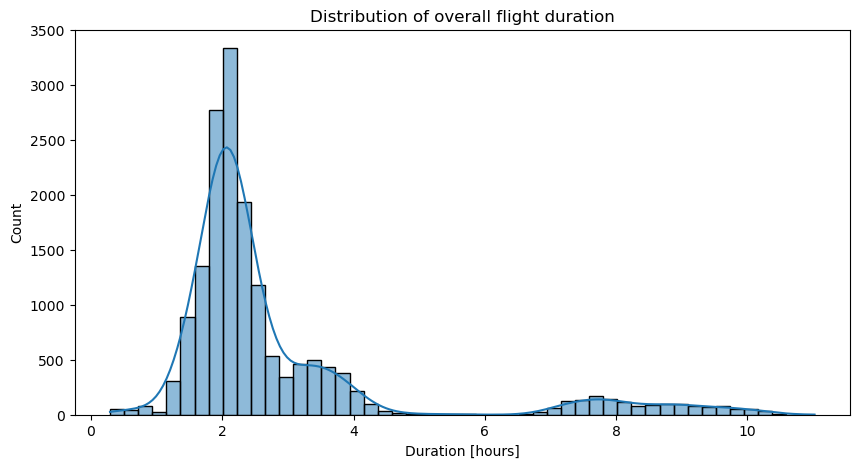

In [34]:
col = 'flight_duration'
plt.figure(figsize=(10, 5))
sns.histplot(data[col], bins=50, edgecolor='black', stat='count', kde=True)
plt.xlabel('Duration [hours]')
plt.ylabel('Count')
plt.title(f'Distribution of overall flight duration')

Text(0.5, 1.0, 'Distribution of total distance')

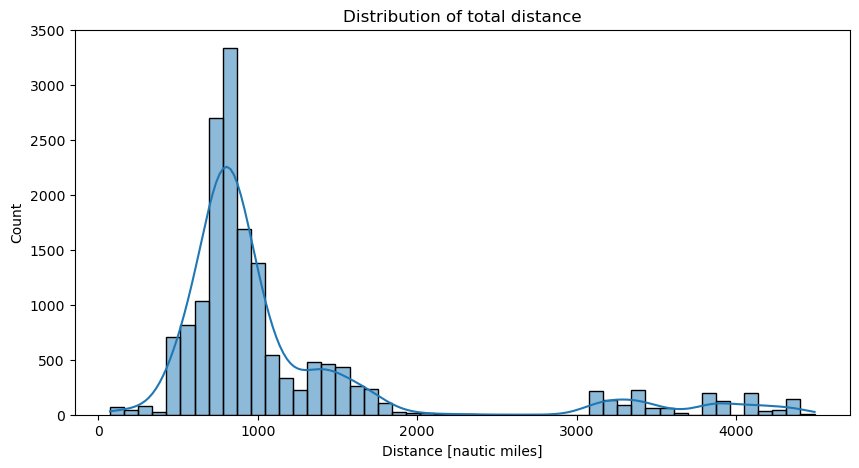

In [35]:
col = 'total_distance'
plt.figure(figsize=(10, 5))
sns.histplot(data[col], bins=50, edgecolor='black', stat='count', kde=True)
plt.xlabel('Distance [nautic miles]')
plt.ylabel('Count')
plt.title(f'Distribution of total distance')

In [36]:
# plot_numerical_distributions(data, numerical_feat)

In [37]:
# plot_boxplots_num(data, numerical_feat)

In [38]:
# plot_pairplot(data, numerical_feat)

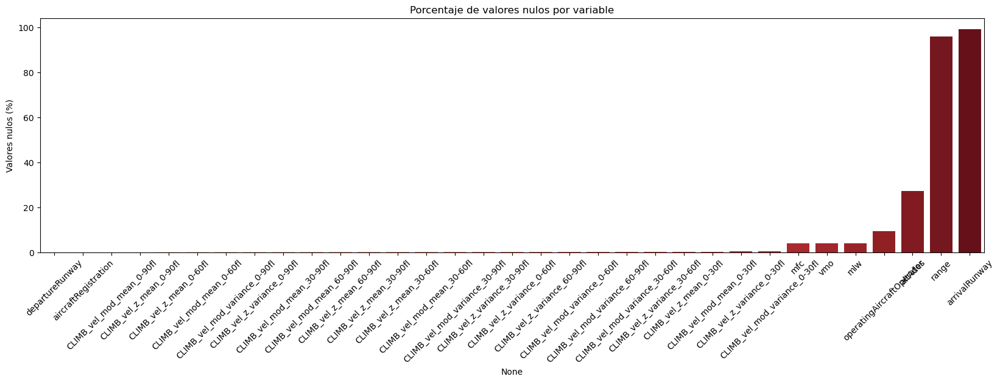

In [39]:
plot_missing_values(data)

# Correlations

## Pearson

In [7]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

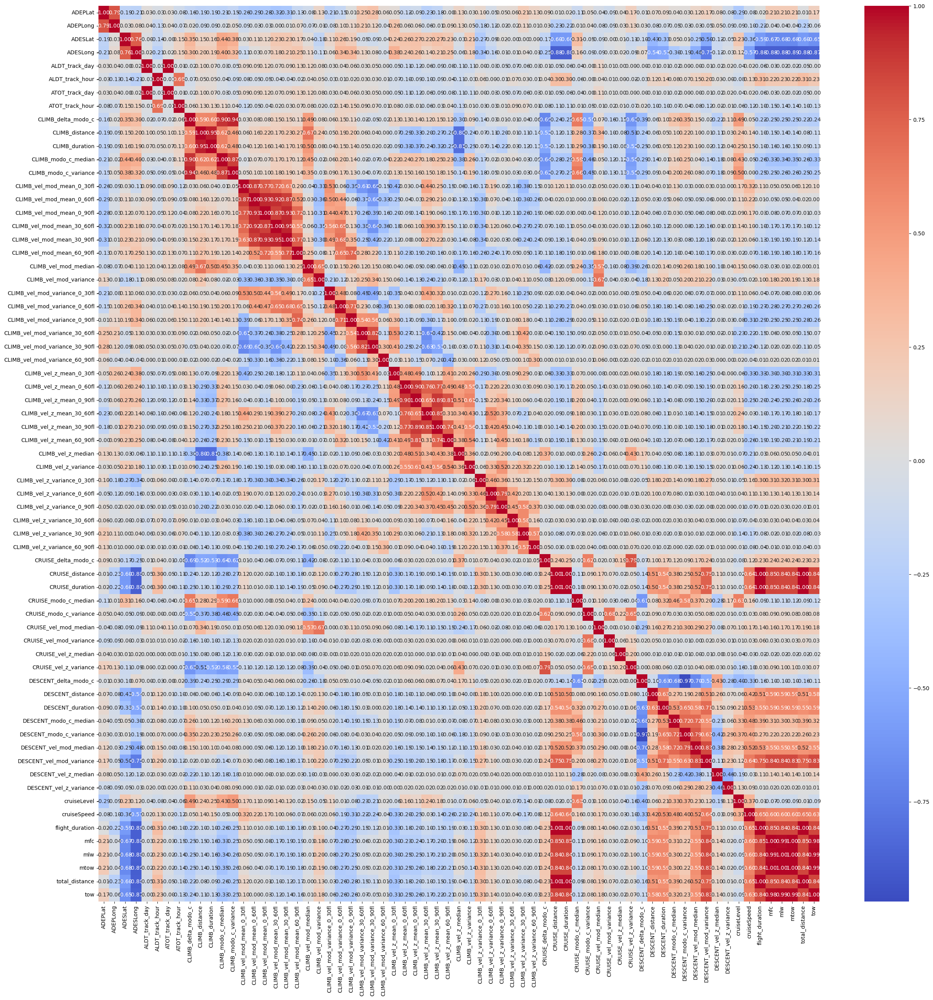

In [11]:
pearson_corr = data[numeric_cols].corr(method='pearson')
plt.figure(figsize=(30, 30))
sns.heatmap(pearson_corr, annot=True, fmt=".2f", cmap="coolwarm")
# plt.title("Pearson Correlation Matrix")
plt.show()

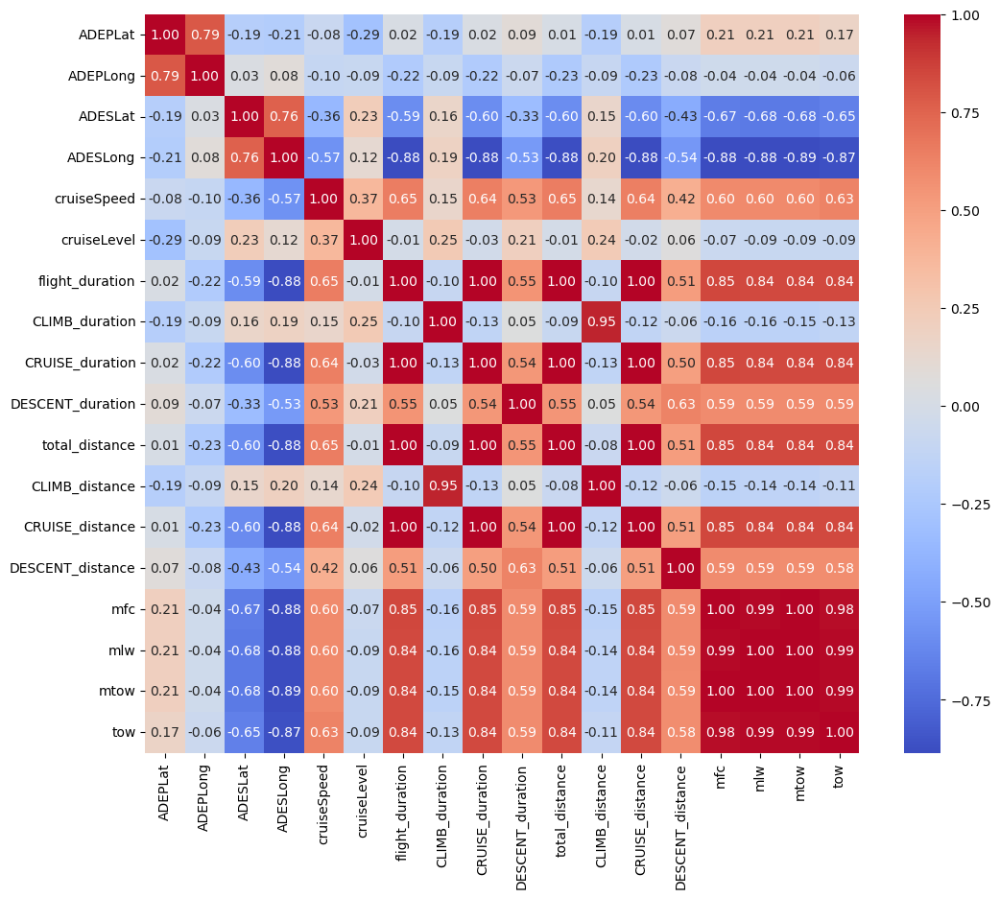

In [23]:
subset = ['ADEPLat', 'ADEPLong', 'ADESLat', 'ADESLong', 'cruiseSpeed', 'cruiseLevel', 'flight_duration', 'CLIMB_duration', 'CRUISE_duration', 'DESCENT_duration', 'total_distance', 'CLIMB_distance', 'CRUISE_distance', 'DESCENT_distance', 'mfc', 'mlw', 'mtow', 'tow']

data[subset] = scaler.fit_transform(data[subset])
pearson_corr = data[subset].corr(method='pearson')
plt.figure(figsize=(12, 10))
sns.heatmap(pearson_corr, annot=True, fmt=".2f", cmap="coolwarm")
# plt.title("Pearson Correlation Matrix")
plt.show()

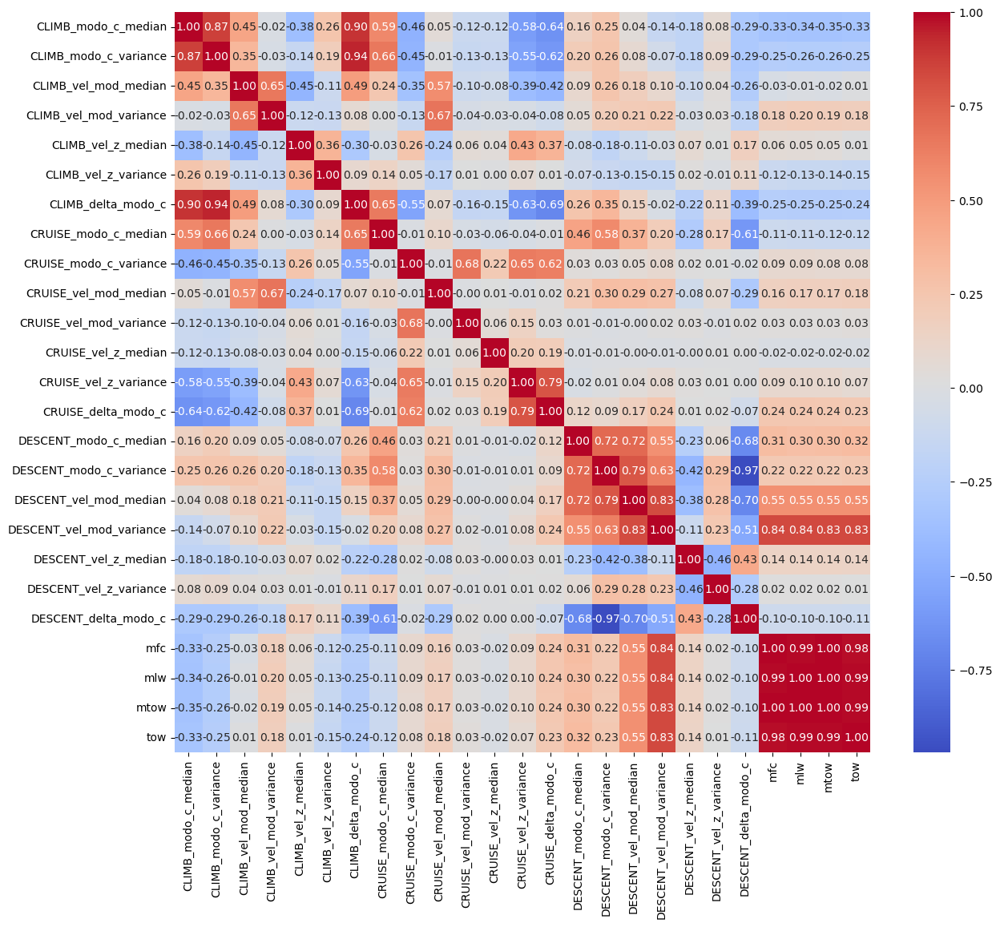

In [25]:
subset = ['CLIMB_modo_c_median', 'CLIMB_modo_c_variance', 'CLIMB_vel_mod_median', 'CLIMB_vel_mod_variance', 'CLIMB_vel_z_median', 'CLIMB_vel_z_variance', 'CLIMB_delta_modo_c', 'CRUISE_modo_c_median', 'CRUISE_modo_c_variance', 'CRUISE_vel_mod_median', 'CRUISE_vel_mod_variance', 'CRUISE_vel_z_median', 'CRUISE_vel_z_variance', 'CRUISE_delta_modo_c', 'DESCENT_modo_c_median', 'DESCENT_modo_c_variance', 'DESCENT_vel_mod_median', 'DESCENT_vel_mod_variance', 'DESCENT_vel_z_median', 'DESCENT_vel_z_variance', 'DESCENT_delta_modo_c', 'mfc', 'mlw', 'mtow', 'tow']

data[subset] = scaler.fit_transform(data[subset])
pearson_corr = data[subset].corr(method='pearson')
plt.figure(figsize=(14, 12))
sns.heatmap(pearson_corr, annot=True, fmt=".2f", cmap="coolwarm")
# plt.title("Pearson Correlation Matrix")
plt.show()

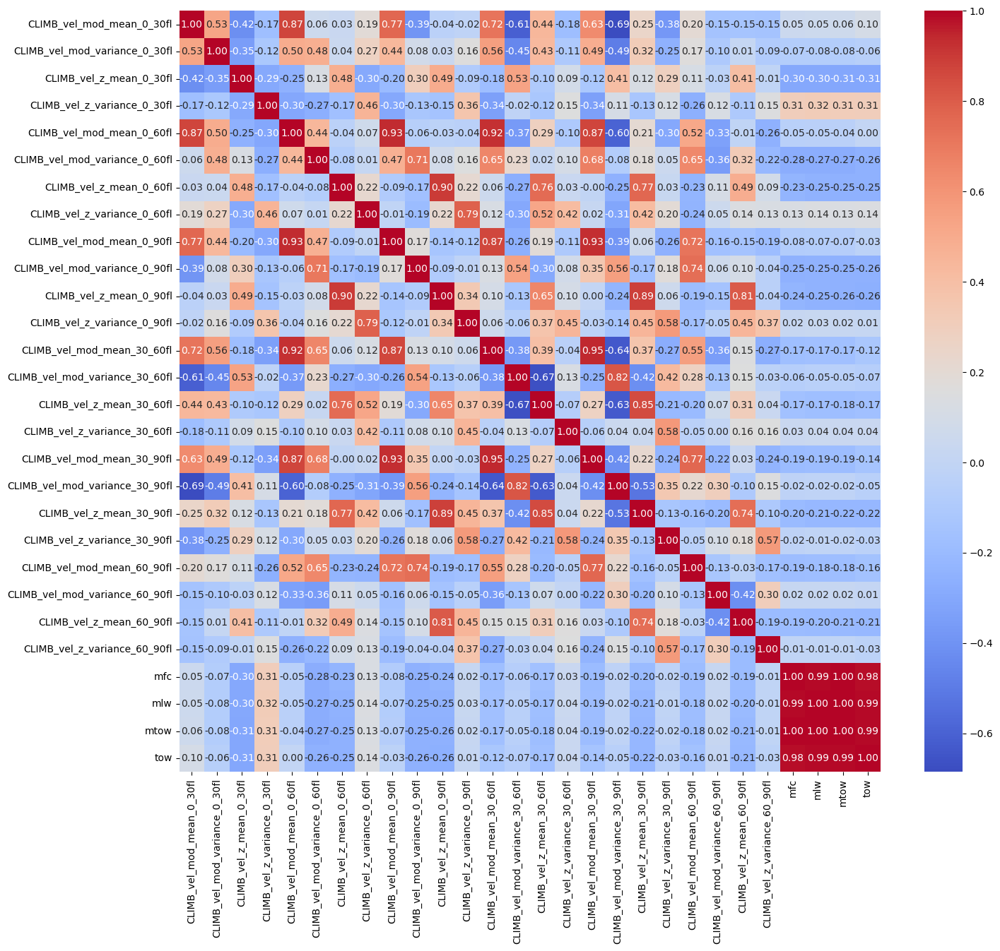

In [31]:
subset = [
 'CLIMB_vel_mod_mean_0_30fl',
 'CLIMB_vel_mod_variance_0_30fl',
 'CLIMB_vel_z_mean_0_30fl',
 'CLIMB_vel_z_variance_0_30fl',
 'CLIMB_vel_mod_mean_0_60fl',
 'CLIMB_vel_mod_variance_0_60fl',
 'CLIMB_vel_z_mean_0_60fl',
 'CLIMB_vel_z_variance_0_60fl',
 'CLIMB_vel_mod_mean_0_90fl',
 'CLIMB_vel_mod_variance_0_90fl',
 'CLIMB_vel_z_mean_0_90fl',
 'CLIMB_vel_z_variance_0_90fl',
 'CLIMB_vel_mod_mean_30_60fl',
 'CLIMB_vel_mod_variance_30_60fl',
 'CLIMB_vel_z_mean_30_60fl',
 'CLIMB_vel_z_variance_30_60fl',
 'CLIMB_vel_mod_mean_30_90fl',
 'CLIMB_vel_mod_variance_30_90fl',
 'CLIMB_vel_z_mean_30_90fl',
 'CLIMB_vel_z_variance_30_90fl',
 'CLIMB_vel_mod_mean_60_90fl',
 'CLIMB_vel_mod_variance_60_90fl',
 'CLIMB_vel_z_mean_60_90fl',
 'CLIMB_vel_z_variance_60_90fl',
 'mfc', 'mlw', 'mtow', 'tow'
]
data[subset] = scaler.fit_transform(data[subset])
pearson_corr = data[subset].corr(method='pearson')
plt.figure(figsize=(16, 14))
sns.heatmap(pearson_corr, annot=True, fmt=".2f", cmap="coolwarm")
# plt.title("Pearson Correlation Matrix")
plt.show()

## Spearman

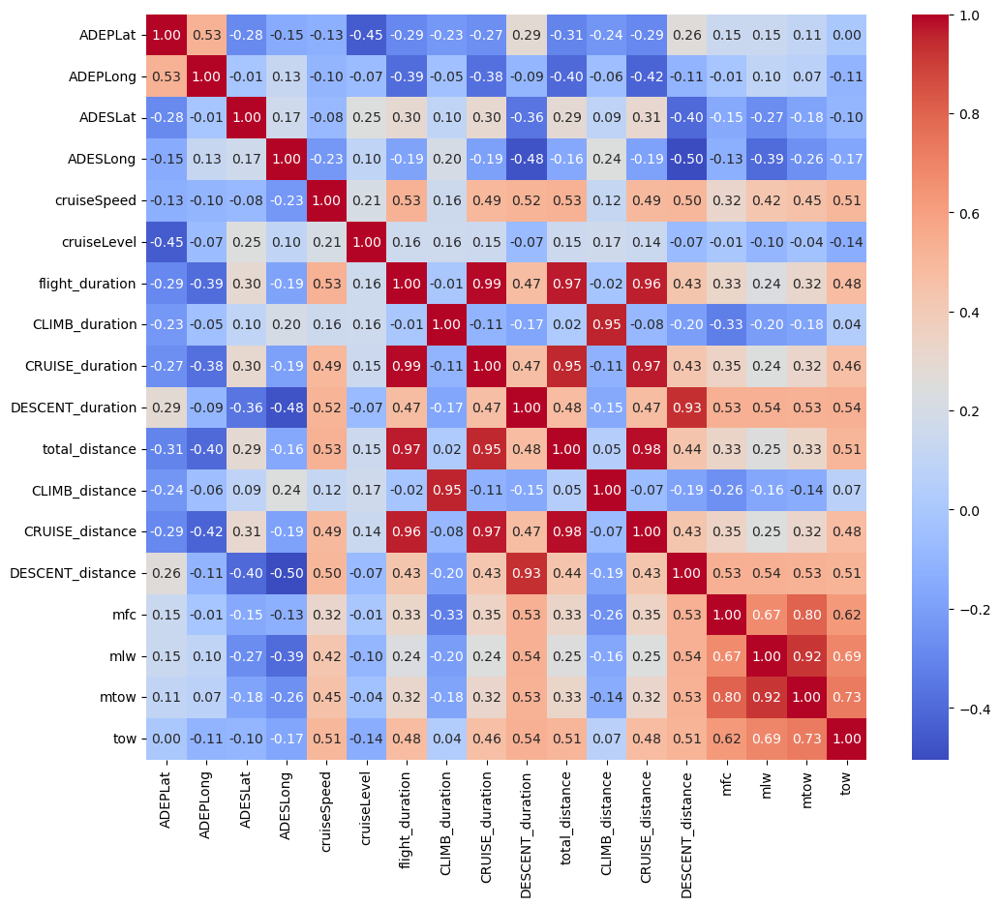

In [32]:
subset = ['ADEPLat', 'ADEPLong', 'ADESLat', 'ADESLong', 'cruiseSpeed', 'cruiseLevel', 'flight_duration', 'CLIMB_duration', 'CRUISE_duration', 'DESCENT_duration', 'total_distance', 'CLIMB_distance', 'CRUISE_distance', 'DESCENT_distance', 'mfc', 'mlw', 'mtow', 'tow']
data[subset] = scaler.fit_transform(data[subset])
spearman_corr = data[subset].corr(method='spearman')
plt.figure(figsize=(12, 10))
sns.heatmap(spearman_corr, annot=True, fmt=".2f", cmap="coolwarm")
# plt.title("Spearman Correlation Matrix")
plt.show()

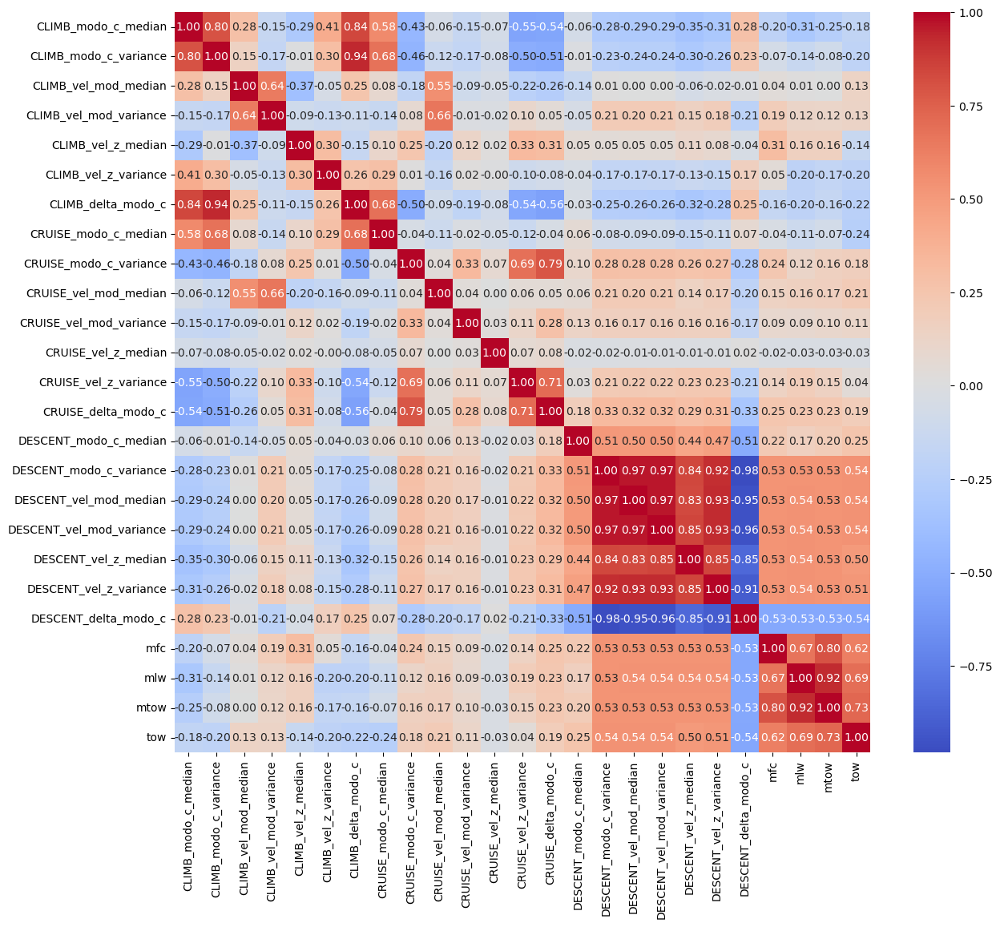

In [34]:
subset = ['CLIMB_modo_c_median', 'CLIMB_modo_c_variance', 'CLIMB_vel_mod_median', 'CLIMB_vel_mod_variance', 'CLIMB_vel_z_median', 'CLIMB_vel_z_variance', 'CLIMB_delta_modo_c', 'CRUISE_modo_c_median', 'CRUISE_modo_c_variance', 'CRUISE_vel_mod_median', 'CRUISE_vel_mod_variance', 'CRUISE_vel_z_median', 'CRUISE_vel_z_variance', 'CRUISE_delta_modo_c', 'DESCENT_modo_c_median', 'DESCENT_modo_c_variance', 'DESCENT_vel_mod_median', 'DESCENT_vel_mod_variance', 'DESCENT_vel_z_median', 'DESCENT_vel_z_variance', 'DESCENT_delta_modo_c', 'mfc', 'mlw', 'mtow', 'tow']
data[subset] = scaler.fit_transform(data[subset])
spearman_corr = data[subset].corr(method='spearman')
plt.figure(figsize=(14, 12))
sns.heatmap(spearman_corr, annot=True, fmt=".2f", cmap="coolwarm")
# plt.title("Spearman Correlation Matrix")
plt.show()

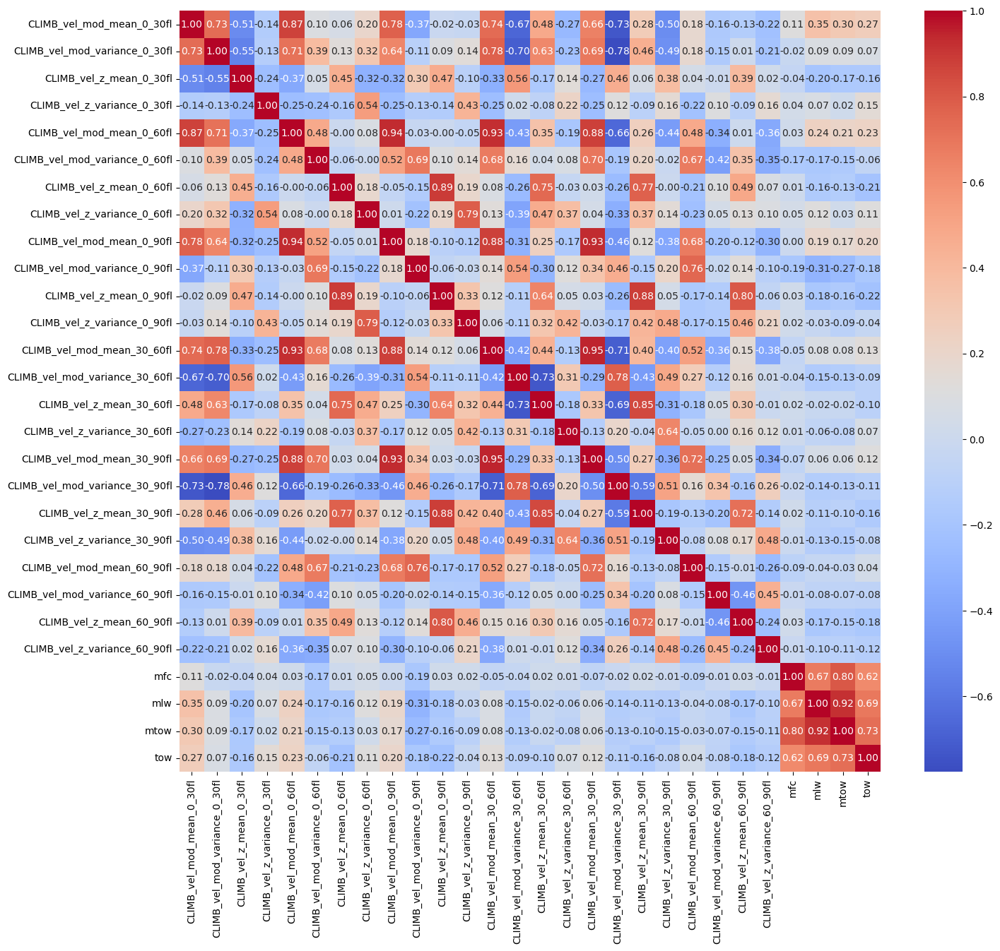

In [36]:
subset = [
 'CLIMB_vel_mod_mean_0_30fl',
 'CLIMB_vel_mod_variance_0_30fl',
 'CLIMB_vel_z_mean_0_30fl',
 'CLIMB_vel_z_variance_0_30fl',
 'CLIMB_vel_mod_mean_0_60fl',
 'CLIMB_vel_mod_variance_0_60fl',
 'CLIMB_vel_z_mean_0_60fl',
 'CLIMB_vel_z_variance_0_60fl',
 'CLIMB_vel_mod_mean_0_90fl',
 'CLIMB_vel_mod_variance_0_90fl',
 'CLIMB_vel_z_mean_0_90fl',
 'CLIMB_vel_z_variance_0_90fl',
 'CLIMB_vel_mod_mean_30_60fl',
 'CLIMB_vel_mod_variance_30_60fl',
 'CLIMB_vel_z_mean_30_60fl',
 'CLIMB_vel_z_variance_30_60fl',
 'CLIMB_vel_mod_mean_30_90fl',
 'CLIMB_vel_mod_variance_30_90fl',
 'CLIMB_vel_z_mean_30_90fl',
 'CLIMB_vel_z_variance_30_90fl',
 'CLIMB_vel_mod_mean_60_90fl',
 'CLIMB_vel_mod_variance_60_90fl',
 'CLIMB_vel_z_mean_60_90fl',
 'CLIMB_vel_z_variance_60_90fl',
 'mfc', 'mlw', 'mtow', 'tow'
]

data[subset] = scaler.fit_transform(data[subset])
spearman_corr = data[subset].corr(method='spearman')
plt.figure(figsize=(16, 14))
sns.heatmap(spearman_corr, annot=True, fmt=".2f", cmap="coolwarm")
# plt.title("Spearman Correlation Matrix")
plt.show()

## Polynomial (with Pearson)

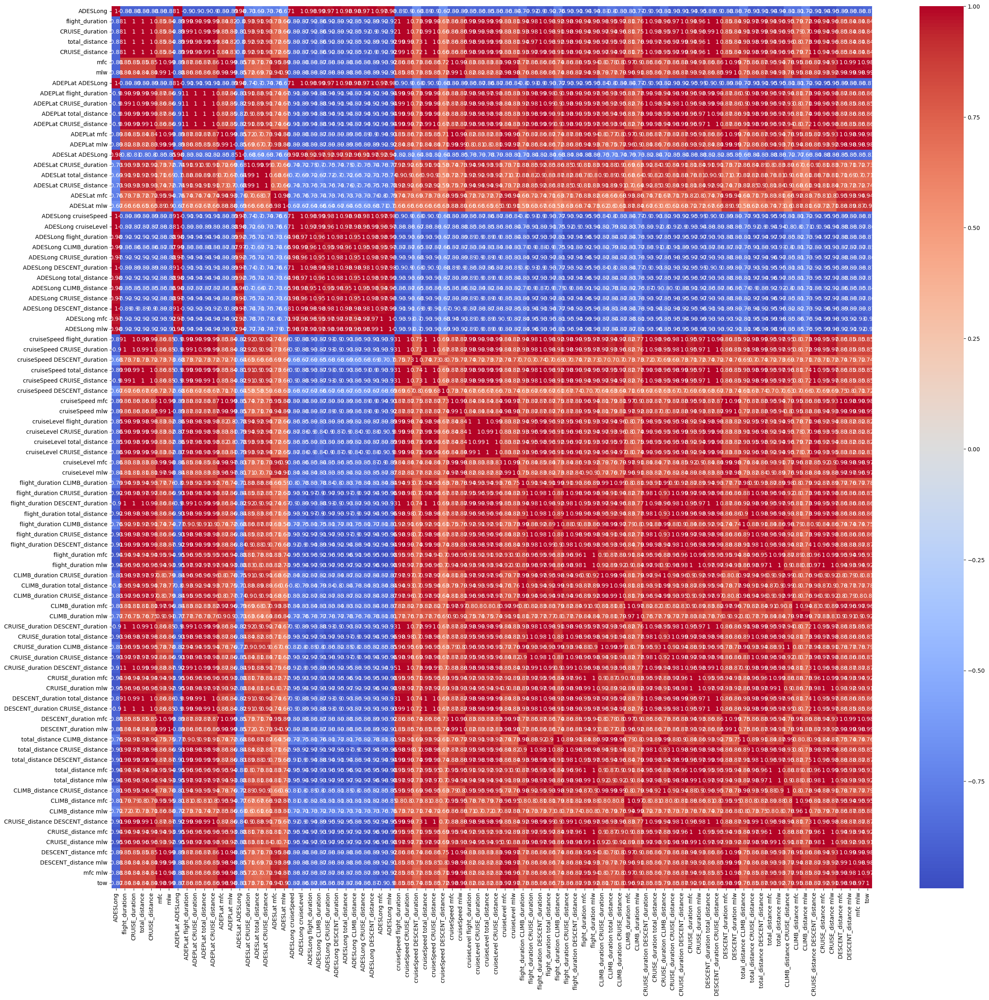

In [9]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)

subset = ['ADEPLat', 'ADEPLong', 'ADESLat', 'ADESLong', 'cruiseSpeed', 'cruiseLevel', 'flight_duration', 'CLIMB_duration', 'CRUISE_duration', 'DESCENT_duration', 'total_distance', 'CLIMB_distance', 'CRUISE_distance', 'DESCENT_distance', 'mfc', 'mlw', 'mtow', 'tow']

# data[subset] = scaler.fit_transform(data[subset])
poly_features = poly.fit_transform(X=data[subset])

poly_feature_names = poly.get_feature_names_out(subset)
poly_features_df = pd.DataFrame(poly_features, columns=poly_feature_names)

poly_corr = poly_features_df.corr(method='pearson')

selected_cols = [
    col for col in poly_corr.columns 
    if abs(poly_corr.loc['tow', col]) > 0.7 and (col == 'tow' or 'tow' not in col)
]
poly_corr_filtered = poly_corr.loc[selected_cols, selected_cols]

# Step 1: Get the list of current indices (row names)
current_indices = poly_corr_filtered.index.tolist()

# Step 2: Remove "tow" from its current position
current_indices.remove("tow")

# Step 3: Add "tow" to the end
current_indices.append("tow")

# Step 4: Reindex the DataFrame with the new order
poly_corr_filtered = poly_corr_filtered.reindex(current_indices)

# If you also want to reorder the columns the same way (common for correlation matrices)
poly_corr_filtered = poly_corr_filtered.reindex(columns=current_indices)

plt.figure(figsize=(30, 28))
sns.heatmap(poly_corr_filtered, cmap="coolwarm", annot=True)
plt.show()

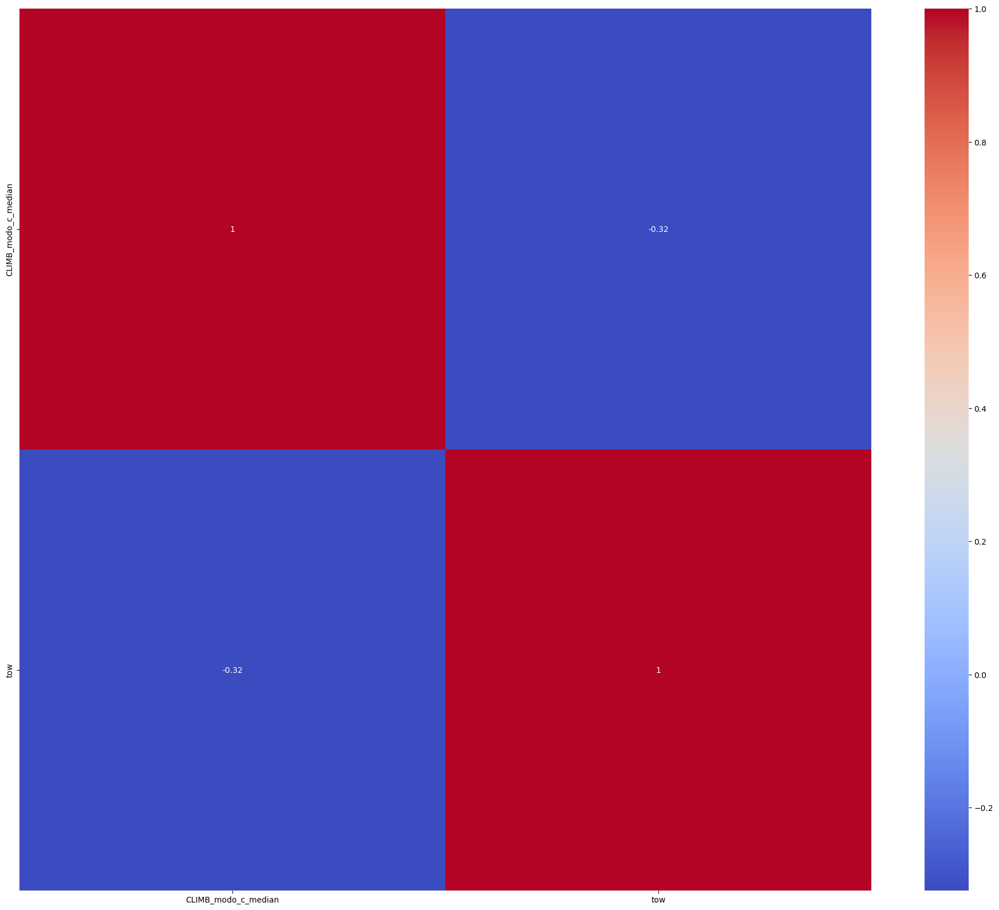

In [51]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)


subset = ['CLIMB_modo_c_median', 'CLIMB_modo_c_variance', 'CLIMB_vel_mod_median', 'CLIMB_vel_mod_variance', 'CLIMB_vel_z_median', 'CLIMB_vel_z_variance', 'CLIMB_delta_modo_c', 'tow']

# subset = ['CLIMB_modo_c_median', 'CLIMB_modo_c_variance', 'CLIMB_vel_mod_median', 'CLIMB_vel_mod_variance', 'CLIMB_vel_z_median', 'CLIMB_vel_z_variance', 'CLIMB_delta_modo_c', 'CRUISE_modo_c_median', 'CRUISE_modo_c_variance', 'CRUISE_vel_mod_median', 'CRUISE_vel_mod_variance', 'CRUISE_vel_z_median', 'CRUISE_vel_z_variance', 'CRUISE_delta_modo_c', 'DESCENT_modo_c_median', 'DESCENT_modo_c_variance', 'DESCENT_vel_mod_median', 'DESCENT_vel_mod_variance', 'DESCENT_vel_z_median', 'DESCENT_vel_z_variance', 'DESCENT_delta_modo_c', 'tow']


data[subset] = scaler.fit_transform(data[subset])
poly_features = poly.fit_transform(X=data[subset])

poly_feature_names = poly.get_feature_names_out(subset)
poly_features_df = pd.DataFrame(poly_features, columns=poly_feature_names)

poly_corr = poly_features_df.corr(method='pearson')

selected_cols = [
    col for col in poly_corr.columns 
    if abs(poly_corr.loc['tow', col]) > 0.3 and (col == 'tow' or 'tow' not in col)
]
poly_corr_filtered = poly_corr.loc[selected_cols, selected_cols]

plt.figure(figsize=(24, 20))
sns.heatmap(poly_corr_filtered, cmap="coolwarm", annot=True)
plt.show()

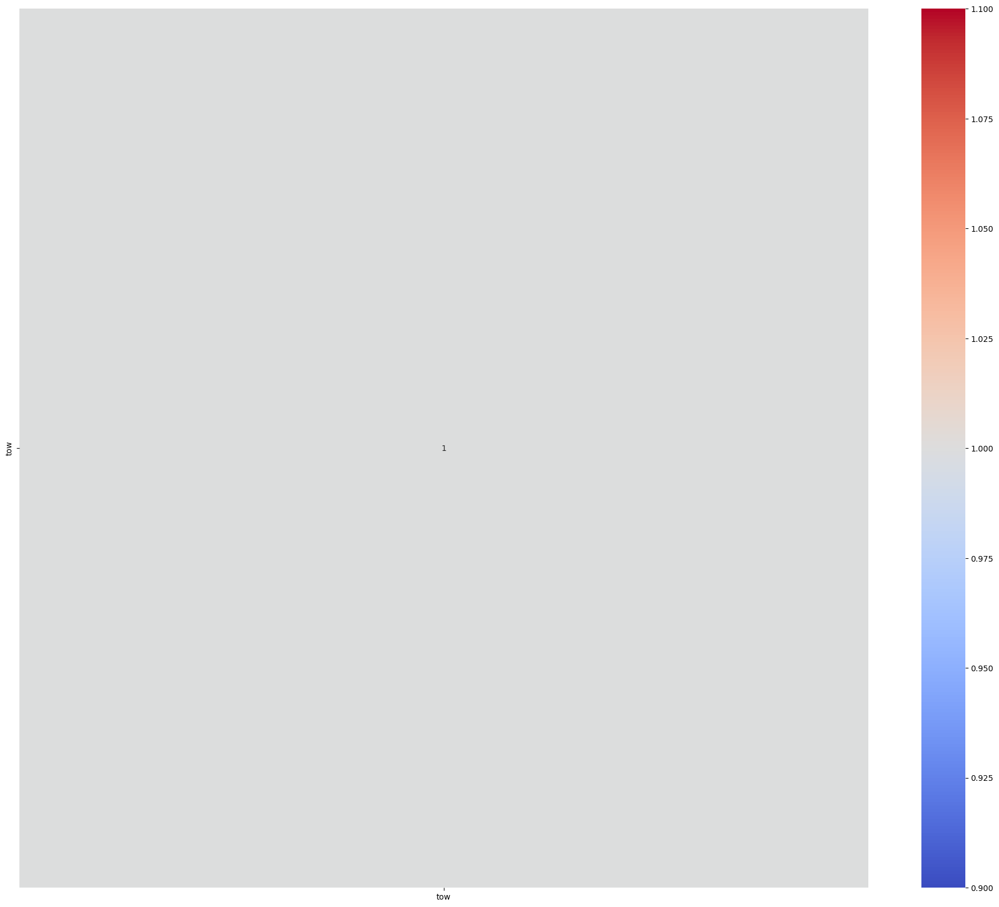

In [53]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)


subset = ['CRUISE_modo_c_median', 'CRUISE_modo_c_variance', 'CRUISE_vel_mod_median', 'CRUISE_vel_mod_variance', 'CRUISE_vel_z_median', 'CRUISE_vel_z_variance', 'CRUISE_delta_modo_c', 'tow']

# subset = ['DESCENT_modo_c_median', 'DESCENT_modo_c_variance', 'DESCENT_vel_mod_median', 'DESCENT_vel_mod_variance', 'DESCENT_vel_z_median', 'DESCENT_vel_z_variance', 'DESCENT_delta_modo_c', 'tow']


data[subset] = scaler.fit_transform(data[subset])
poly_features = poly.fit_transform(X=data[subset])

poly_feature_names = poly.get_feature_names_out(subset)
poly_features_df = pd.DataFrame(poly_features, columns=poly_feature_names)

poly_corr = poly_features_df.corr(method='pearson')

selected_cols = [
    col for col in poly_corr.columns 
    if abs(poly_corr.loc['tow', col]) > 0.3 and (col == 'tow' or 'tow' not in col)
]
poly_corr_filtered = poly_corr.loc[selected_cols, selected_cols]

plt.figure(figsize=(24, 20))
sns.heatmap(poly_corr_filtered, cmap="coolwarm", annot=True)
plt.show()

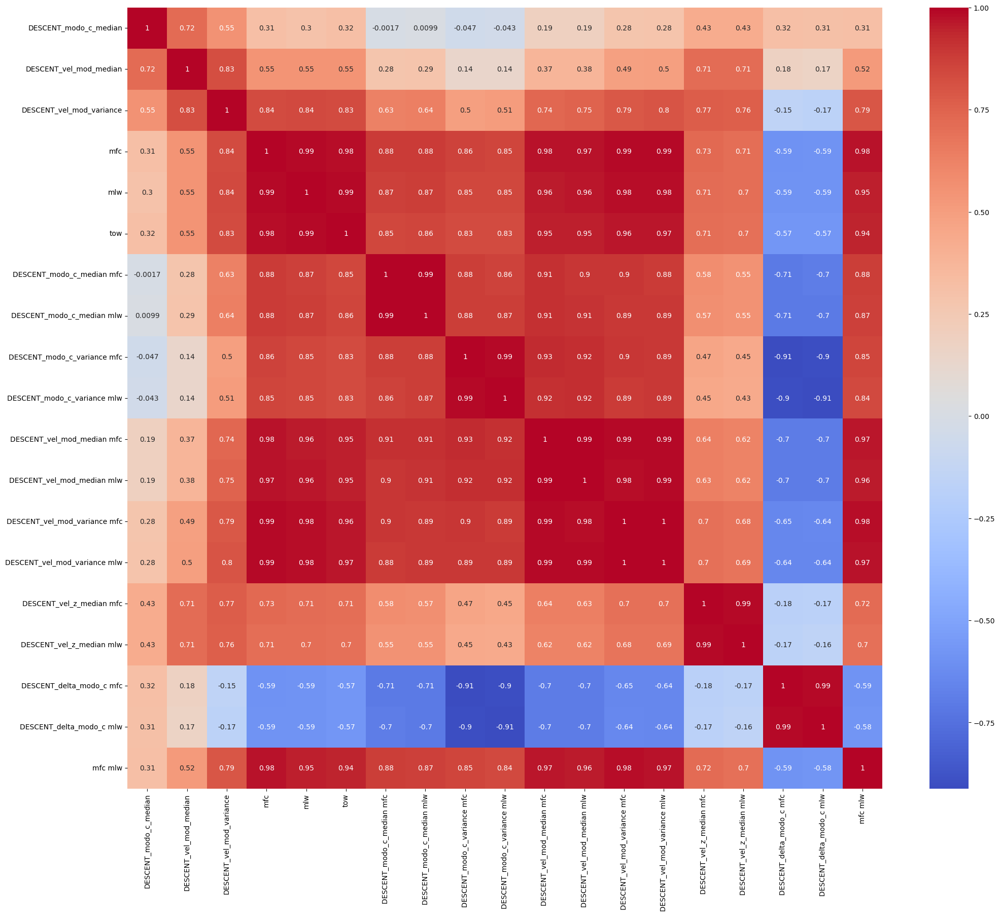

In [41]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)

subset = ['DESCENT_modo_c_median', 'DESCENT_modo_c_variance', 'DESCENT_vel_mod_median', 'DESCENT_vel_mod_variance', 'DESCENT_vel_z_median', 'DESCENT_vel_z_variance', 'DESCENT_delta_modo_c', 'mfc', 'mlw', 'mtow', 'tow']


data[subset] = scaler.fit_transform(data[subset])
poly_features = poly.fit_transform(X=data[subset])

poly_feature_names = poly.get_feature_names_out(subset)
poly_features_df = pd.DataFrame(poly_features, columns=poly_feature_names)

poly_corr = poly_features_df.corr(method='pearson')

selected_cols = [
    col for col in poly_corr.columns 
    if abs(poly_corr.loc['tow', col]) > 0.3 and (col == 'tow' or 'tow' not in col)
]
poly_corr_filtered = poly_corr.loc[selected_cols, selected_cols]

plt.figure(figsize=(24, 20))
sns.heatmap(poly_corr_filtered, cmap="coolwarm", annot=True)
plt.show()

In [41]:
# from sklearn.preprocessing import PolynomialFeatures

# poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)

# subset = ['CLIMB_modo_c_median', 'CLIMB_modo_c_variance', 'CLIMB_vel_mod_median', 'CLIMB_vel_mod_variance', 'CLIMB_vel_z_median', 'CLIMB_vel_z_variance', 'CLIMB_delta_modo_c', 'CRUISE_modo_c_median', 'CRUISE_modo_c_variance', 'CRUISE_vel_mod_median', 'CRUISE_vel_mod_variance', 'CRUISE_vel_z_median', 'CRUISE_vel_z_variance', 'CRUISE_delta_modo_c', 'DESCENT_modo_c_median', 'DESCENT_modo_c_variance', 'DESCENT_vel_mod_median', 'DESCENT_vel_mod_variance', 'DESCENT_vel_z_median', 'DESCENT_vel_z_variance', 'DESCENT_delta_modo_c', 'tow']


# data[subset] = scaler.fit_transform(data[subset])
# poly_features = poly.fit_transform(X=data[subset])

# poly_feature_names = poly.get_feature_names_out(subset)
# poly_features_df = pd.DataFrame(poly_features, columns=poly_feature_names)

# poly_corr = poly_features_df.corr(method='pearson')

# selected_cols = [
#     col for col in poly_corr.columns 
#     if abs(poly_corr.loc['tow', col]) > 0.6 and (col == 'tow' or 'tow' not in col)
# ]
# poly_corr_filtered = poly_corr.loc[selected_cols, selected_cols]

# plt.figure(figsize=(24, 20))
# sns.heatmap(poly_corr_filtered, cmap="coolwarm", annot=True)
# plt.show()

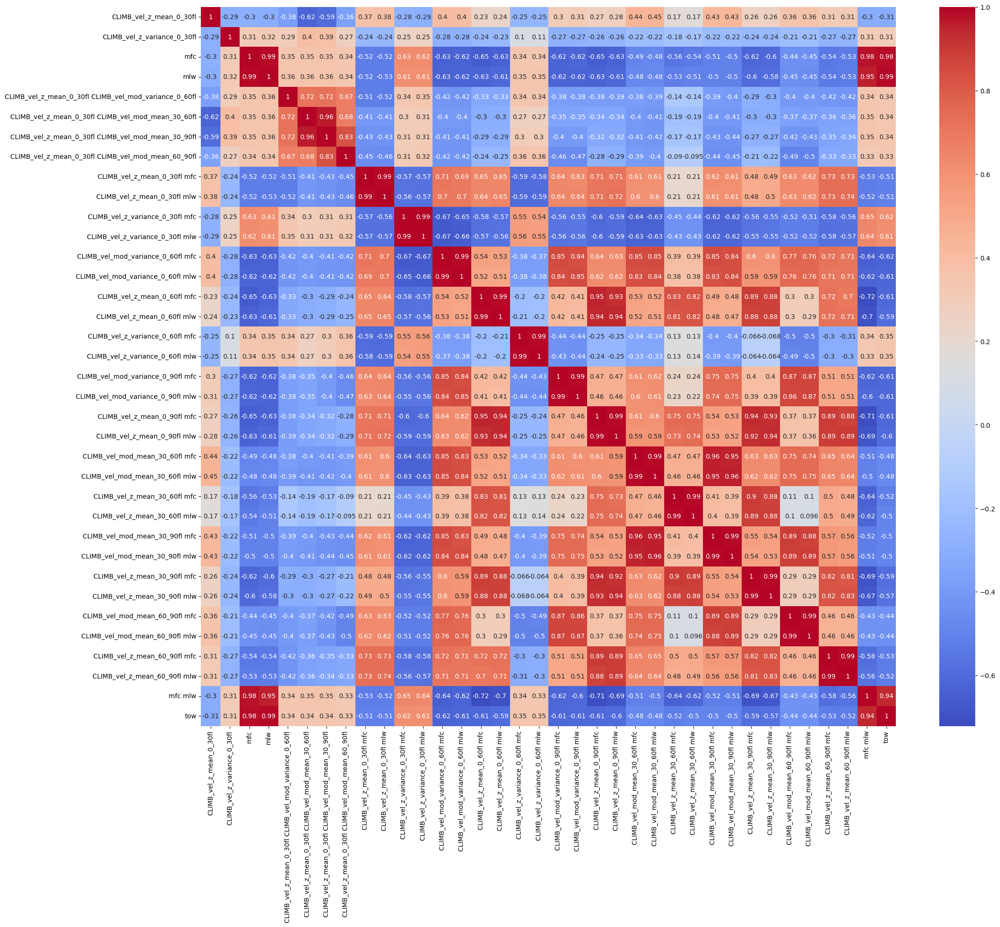

In [43]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)

subset = [
 'CLIMB_vel_mod_mean_0_30fl',
 'CLIMB_vel_mod_variance_0_30fl',
 'CLIMB_vel_z_mean_0_30fl',
 'CLIMB_vel_z_variance_0_30fl',
 'CLIMB_vel_mod_mean_0_60fl',
 'CLIMB_vel_mod_variance_0_60fl',
 'CLIMB_vel_z_mean_0_60fl',
 'CLIMB_vel_z_variance_0_60fl',
 'CLIMB_vel_mod_mean_0_90fl',
 'CLIMB_vel_mod_variance_0_90fl',
 'CLIMB_vel_z_mean_0_90fl',
 'CLIMB_vel_z_variance_0_90fl',
 'CLIMB_vel_mod_mean_30_60fl',
 'CLIMB_vel_mod_variance_30_60fl',
 'CLIMB_vel_z_mean_30_60fl',
 'CLIMB_vel_z_variance_30_60fl',
 'CLIMB_vel_mod_mean_30_90fl',
 'CLIMB_vel_mod_variance_30_90fl',
 'CLIMB_vel_z_mean_30_90fl',
 'CLIMB_vel_z_variance_30_90fl',
 'CLIMB_vel_mod_mean_60_90fl',
 'CLIMB_vel_mod_variance_60_90fl',
 'CLIMB_vel_z_mean_60_90fl',
 'CLIMB_vel_z_variance_60_90fl',
 'mfc', 'mlw', 'mtow', 'tow'
]

climb_data = data[subset].copy()
climb_data = climb_data.dropna()
climb_data = scaler.fit_transform(climb_data)
poly_features = poly.fit_transform(X=climb_data)

poly_feature_names = poly.get_feature_names_out(subset)
poly_features_df = pd.DataFrame(poly_features, columns=poly_feature_names)
poly_corr = poly_features_df.corr(method='pearson')

selected_cols = [
    col for col in poly_corr.columns 
    if abs(poly_corr.loc['tow', col]) > 0.3 and (col == 'tow' or 'tow' not in col)
]
poly_corr_filtered = poly_corr.loc[selected_cols, selected_cols]

# Step 1: Get the list of current indices (row names)
current_indices = poly_corr_filtered.index.tolist()

# Step 2: Remove "tow" from its current position
current_indices.remove("tow")

# Step 3: Add "tow" to the end
current_indices.append("tow")

# Step 4: Reindex the DataFrame with the new order
poly_corr_filtered = poly_corr_filtered.reindex(current_indices)

# If you also want to reorder the columns the same way (common for correlation matrices)
poly_corr_filtered = poly_corr_filtered.reindex(columns=current_indices)


plt.figure(figsize=(24, 20))
sns.heatmap(poly_corr_filtered, cmap="coolwarm", annot=True)
plt.show()

# tow

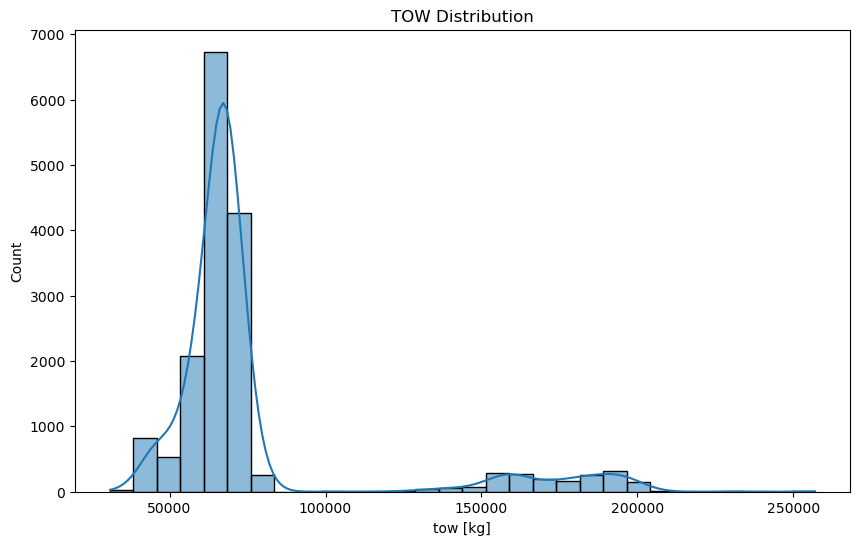

In [10]:
plt.figure(figsize=(10,6))
sns.histplot(data['tow'], kde=True, bins=30)
plt.title("TOW Distribution")
plt.xlabel("tow [kg]")
plt.ylabel("Count")
plt.show()

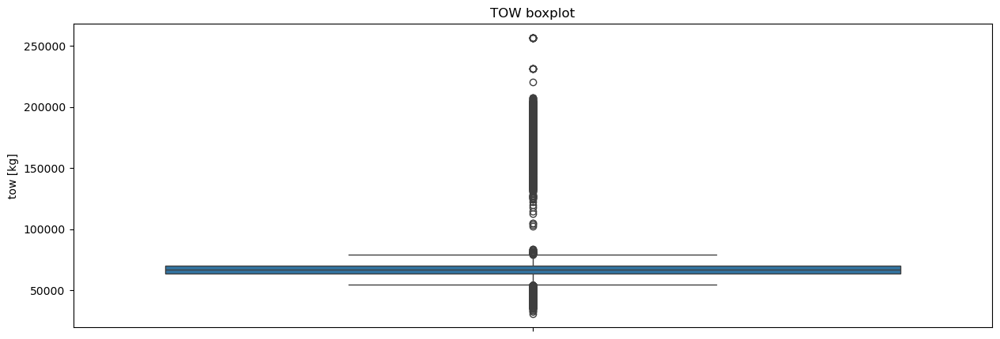

In [11]:
plt.figure(figsize=(15,5))
sns.boxplot(y=data['tow'])
plt.ylabel("tow [kg]")
plt.title("TOW boxplot")
plt.show()

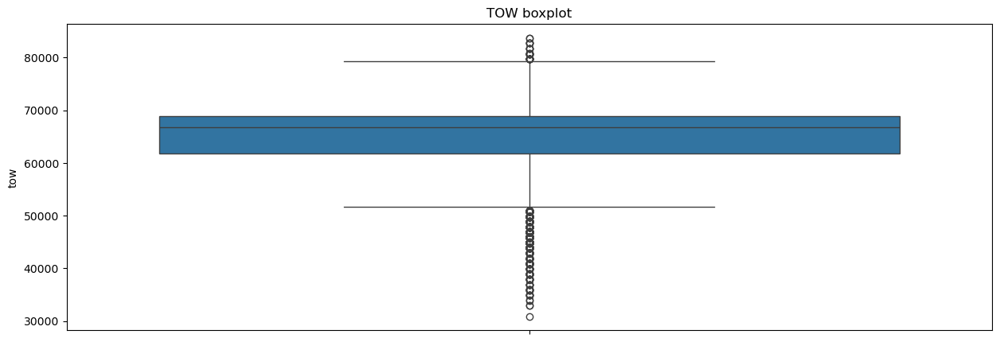

In [8]:
plt.figure(figsize=(15,5))
sns.boxplot(y=data[data['tow'] < 100000]['tow'])
plt.title("TOW boxplot")
plt.show()